In [2]:
%reset
import torch
import torch.nn as nn
from torchvision import models
from collections import defaultdict
import torch.nn.functional as F
from utils.loss import dice_loss

from utils.dataloader import *
from utils.ply import *
from utils.models import *
import utils.alienlab as alien

import utils.tests as test
import utils.proj_point_cloud as ppc
import utils.vox_to_coord as vtc

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, datasets, models
import numpy as np
import json
from PIL import Image
import imageio

import glob
import torch
import torch.optim as optim
from torch.optim import lr_scheduler
import time
import copy

from mpl_toolkits import mplot3d
from IPython.display import Image as IPIMage



Once deleted, variables cannot be recovered. Proceed (y/[n])? y


ERROR:root:Invalid alias: The name clear can't be aliased because it is another magic command.
ERROR:root:Invalid alias: The name more can't be aliased because it is another magic command.
ERROR:root:Invalid alias: The name less can't be aliased because it is another magic command.
ERROR:root:Invalid alias: The name man can't be aliased because it is another magic command.


In [3]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
    

torch.cuda.get_device_properties(device).total_memory/1e9
torch.cuda.memory_allocated(device)/1e9

cuda:0


0.0

# Image segmentation

### Load model

In [4]:
if True: 
    model = torch.load('model_weights/trained_model.pt') #needs utils.models imported
    
torch.cuda.memory_allocated(device)/1e9

0.249205248

### Trial images and dataloader

In [5]:
trans_reshape = transforms.Compose([
    #transforms.Resize((448,896)),
    transforms.CenterCrop((896, 448)),
    transforms.ToTensor(),
    #transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]) # imagenet
])

Brec = 2 #batch number
i = 4 #palnt index
N_cam = 72

 #image path of one plant (N_cam views) and labels
image_paths = np.sort(glob.glob("data/arabidopsis/train/images/*.png"))[N_cam*i:N_cam*(i+1)]
target_paths = np.sort(glob.glob("data/arabidopsis/train/labels/*.png"))[N_cam*i:N_cam*(i+1)]

reconstruction_dataset = CustomDataset(image_paths, target_paths, transform = trans_reshape) #dataloader
reconstruction_loader = torch.utils.data.DataLoader(reconstruction_dataset, batch_size=Brec, shuffle=False, num_workers=1)

print(torch.cuda.memory_allocated(device)/1e9)

0.249205248


In [6]:
# Prediction
def evaluate(inputs):

    with torch.no_grad():
        inputs.requires_grad = False
        # Get the first batch
        inputs = inputs.to(device)

        pred = model(inputs)
        # The loss functions include the sigmoid function.
        pred = F.sigmoid(pred)
        
    return pred

model.eval()

pred_tot = []
for inputs, labels in reconstruction_loader: #Predict from dataloader
    pred = evaluate(inputs)
    pred_tot.append(pred) 
    
pred_tot = torch.cat(pred_tot, dim = 0) #All predictions into one tensor
pred = pred.data.cpu().numpy()


/home/alienor/Documents/Segmentation/segmentation/lib/python3.7/site-packages/torch/nn/functional.py:1386: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


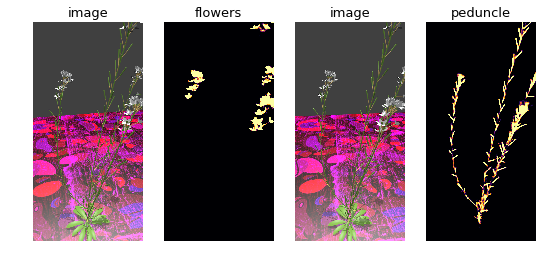

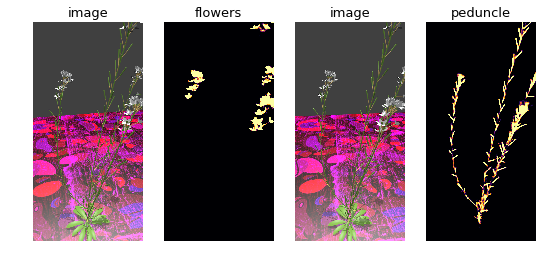

In [7]:
g = alien.showclass() #plotting tool

label_num = 6
labels_names = ['background', 'flowers', 'peduncle', 'stem', 'leaves', 'fruits']

# Change channel-order and make 3 channels for matplot
input_images_cpu = [reverse_transform(x) for x in inputs.cpu()]
abels_cpu = labels.cpu().numpy()

# Map each channel (i.e. class) to each color
compare = []
lab = 2
tl = []
for i in range(lab):
    compare.append(input_images_cpu[i])
    tl.append('image')
    compare.append(pred[i,i+1])
    tl.append(labels_names[i+1])
g.col_num = lab*2
g.title_list = tl
g.showing(compare)


# Space carving

### Camera parameters

In [6]:
with open('images.json', 'r') as f:
    pose = json.load(f)

N_cam = 72
N_feat = 72

extrinsics = torch.zeros((N_cam, 3, 4))
for i in range(N_cam):
    rot = pose[str(i+1)]['rotmat']
    extrinsics[i][:3,:3] = torch.Tensor(rot)
    trans = pose[str(i+1)]['tvec']
    extrinsics[i][:,3] = torch.Tensor(trans)/10.

with open('cameras.json', 'r') as f:
    focal = json.load(f)
focal = focal['1']['params']

r = 1#1080/448

intrinsics = torch.zeros((1, 3, 3))
intrinsics[:,0,0] = focal[0]*r
intrinsics[:,1,1] = focal[0]*r
intrinsics[:,0,2] = focal[1]*r
intrinsics[:,1,2] = focal[2]*r
intrinsics[:,2,2] = 1

### Voxels

In [7]:
cloud_scale = 0.5
sc = 5

N = int(65/cloud_scale)
#Voxel representation of the point cloud
min_vec = [int(-40/cloud_scale), int(-40/cloud_scale),int(-5/cloud_scale)] #Limit of the cloud
basis_voxels = vtc.basis_vox(min_vec, N, N, N)*cloud_scale#List of coordinates  

Text(0.5, 0.92, 'Centers of the voxels of the volume that will be carved (undersampled)')

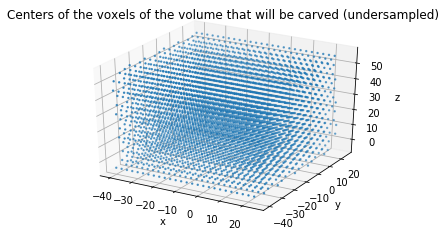

In [8]:
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.scatter3D(basis_voxels[1:-1:500,0], basis_voxels[1:-1:500,1], basis_voxels[1:-1:500,2], cmap='Greens', s= 2);
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_title('Centers of the voxels of the volume that will be carved (undersampled)')

### Projection

In [9]:
#Camera projection

torch_voxels = torch.from_numpy(basis_voxels)
#Perspective projection
xy_coords = vtc.project_coordinates(torch_voxels, intrinsics, extrinsics, give_prod = False)

#permute x and y coordinates
xy_coords[:, 2, :] = xy_coords[:,0,:]
xy_coords[:, 0, :] = xy_coords[:,1,:]
xy_coords[:, 1, :] = xy_coords[:,2,:]

ind = torch_voxels[:,3]==1

Sx = 896 #Center crop
Sy = 448
xinit = 1080 #Original image size
yinit = 1920

### Invert the center crop

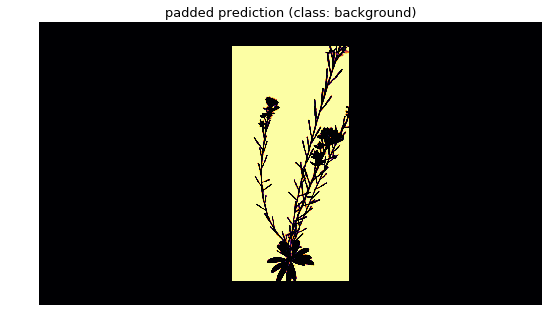

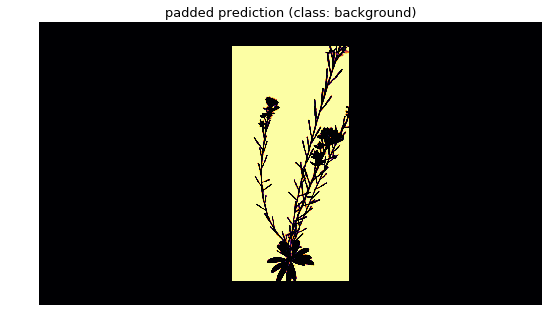

In [11]:

pred_pad = torch.zeros((N_cam, label_num, xinit, yinit))
pred_tot_cop = pred_tot.clone()
pred_pad[:,:,(xinit-Sx)//2:(xinit+Sx)//2,(yinit-Sy)//2:(yinit+Sy)//2] = pred_tot_cop #To fit the camera parameters
g.title_list = ['padded prediction (class: background)']
g.showing(pred_pad[0,0,:,:])


# Projection from voxels to images

In [12]:
def correct_coords_outside(coordinates, Sx, Sy, xinit, yinit, val):
    '''This function ensures that the voxels ot the volume that 
    don't project onto the different views won't generate index errors when we project them onto the predictions
    We will associate to them a specific label meaning "voxel projected outside of the image"
    Inputs: -coodinates xy for each view (torch tensor)
            -center crop dimensions
            -image dimensions
            -value to assign to the coordinates projectiong outside (-1 is a good choice)
    Output: Modified coordinates
    '''
    
    coords = coordinates.clone()
    
    indices = (coords[:,0,:] < (xinit-Sx)/2) #lower bound for x
    ind_stack = torch.stack([indices]*3, dim = 1)
    coords[ind_stack] = val
    
    indices = (coords[:,1,:] < (yinit-Sy)/2) #lower bound for y
    ind_stack = torch.stack([indices]*3, dim = 1)
    coords[ind_stack] = val
    
    indices = (coords[:,0,:] > (xinit+Sx)/2) #upper bound for x
    ind_stack = torch.stack([indices]*3, dim = 1)
    coords[ind_stack] = val
    
    indices = (coords[:,1,:] > (yinit+Sy)/2) #upper bound for y
    ind_stack = torch.stack([indices]*3, dim = 1)
    coords[ind_stack] = val
    
    return coords.long()


def adjust_predictions(preds):
    '''
    The predictions have to be flattened to be accessed by the coordinates tensor. 
    Also a new class has to be added to 
    describe the voxels prohjecting outside the image. 
    These voxels will project onto the last element of the flattened predictions
    that correspond to "pixel outside the image" class.
    Input: predictions in shape (N_cam, W, H, num_labels) torch tensor
    Output: Flattened predictions (N_cam * W * H + 1, num_labels + 1)
    '''
    outside_proj_label = (preds[:,:,:,0]*0).unsqueeze(-1) 
    preds = torch.cat([preds, outside_proj_label], dim = 3) #Add a label class: voxel projects outside image
    preds_flat = torch.flatten(preds, end_dim = -2) #Flatten the predictions
    
    outside_label = preds_flat[0] * 0
    outside_label[-1] = 1 
    outside_label = outside_label.unsqueeze(0)
    preds_flat = torch.cat([preds_flat, outside_label]) #Add a last prediction where all 
    #voxels that project outside the  image will collect their class
    
    return preds_flat


def flatten_coordinates(coords, shape_predictions):
    '''
    To access the predictions by indexing, the indexes have to be modified according to the 
    flattened predicitions.
    Inputs: -xy coordinates
            -shape of the predictions before flattening
    Output: adapted coordinates + take into account the coordinates that project outside the images
            they will project onto the last element of the flattened predictions
    '''
    xx = coords[:,0]
    yy = coords[:,1]
    xy = torch.mul(xx, shape_predictions[2]) + yy  #manually perform ravel_multi_index from numpy, along X and Y 
    
    flat_factor = shape_predictions[1] * shape_predictions[2] 
    flat_vec = torch.mul(torch.linspace(0, shape_predictions[0] - torch.tensor(1), shape_predictions[0]), flat_factor)
    flat_vec = flat_vec.unsqueeze(1).long()
    flat_coo = torch.add(xy, flat_vec) #Perform it along the views N_cam
    flat_coo[xy < 0] = -1 #Set the negative indexes 

    xy_full_flat = torch.flatten(flat_coo)
    
    
    return xy_full_flat

In [13]:
vol = torch_voxels.clone() #torch.from_numpy(vtc.basis_vox(min_vec, N, N, N)) 

coords = correct_coords_outside(xy_coords, Sx, Sy, xinit, yinit, -1) #correct the coordinates that project outside

preds = pred_pad.clone()
preds = preds.permute(0,2,3,1)
preds_flat = adjust_predictions(preds)
xy_full_flat = flatten_coordinates(coords, preds.shape)

torch.save(torch_voxels, 'voxel_coord/voxels_%02d.pt'%sc)
torch.save(xy_full_flat, 'voxel_coord/coordinates_%02d.pt'%sc)

assign_preds = preds_flat[xy_full_flat].reshape(preds.shape[0], coords.shape[-1], preds_flat.shape[-1])

all_views_preds = torch.sum(assign_preds, dim = 0)

for labl in range(6):
    vol[:,3] = all_views_preds[:,labl]

    points = vol[vol[:,3] > 30, :]
    points[:,3] = labl
    write_ply('rebuilt_cloud_%d.ply'%labl, [points.numpy()],
      ['x', 'y', 'z', 'label'])
    

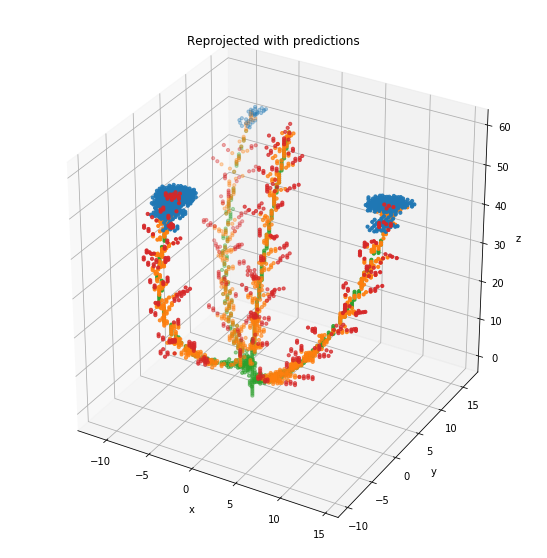

In [14]:
colors = ['r.', 'k.', 'g.', 'b.']

fig = plt.figure(figsize = (10,10))
ax = plt.axes(projection='3d')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_aspect('equal')
ax.set_title('Reprojected with predictions')

i = 0
for labl in [1,2,3,5]:

    vol[:,3] = all_views_preds[:,labl]

    points = vol[vol[:,3] > 30, :]
    points[:,3] = labl
    ax.scatter3D(points[:,0], points[:,1], points[:,2], colors[i], s=10)
    i += 1



In [16]:
if False: 
    the_shape = pred_pad.shape
    vol = torch_voxels#.clone() #torch.from_numpy(vtc.basis_vox(min_vec, N, N, N)) 

    coords = correct_coords_outside(xy_coords, Sx, Sy, xinit, yinit, -1) #correct the coordinates that project outside
    del pred_pad
    xy_full_flat = flatten_coordinates(coords, the_shape)
    torch.save(xy_full_flat, 'voxel_coord/coordinates_05.pt')
    torch.save(torch_voxels, 'voxel_coord/voxels_05.pt')

#### EXTRA DEMO TO UNDERSTAND SPACE CARVING: simulate projection using a point cloud

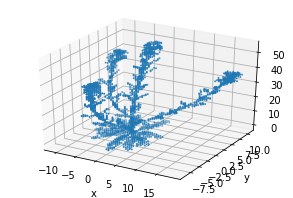

In [10]:
n = 9 #plant example
filepath = r"point_clouds/arabidopsis_%d"%n
density = 10 #pts/cm³


#Set point cloud density by calling cloudcompare
points = ppc.load_mesh_as_pcd(filepath, n, density, cloud_scale)
voxels = ppc.fill_vox(points, basis_voxels, cloud_scale, min_vec, N, N, N) #Fill the coordinates
torch_voxels = torch.from_numpy(voxels)

#test
fig = plt.figure(figsize = (5,5))
ax = plt.axes(projection='3d')

vox = voxels[voxels[:,3]==1]
ax.scatter(vox[:,0], vox[:,1], vox[:,2], s = 1)

ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_aspect('equal')

In [37]:
#Perspective projection
xy_coords = vtc.project_coordinates(torch_voxels, intrinsics, extrinsics, give_prod = False)

#### Simulate camera trajectory by moving the plant

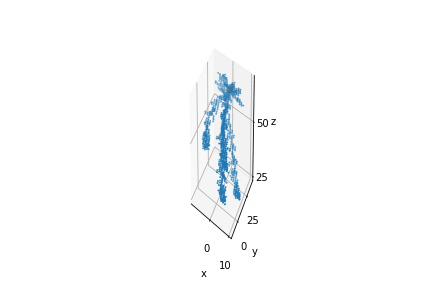

In [38]:
#test.move_camera(torch_voxels, extrinsics, N_cam, prod)  
with open('test_cloud/camera_pos.gif','rb') as file:
    display(IPIMage(file.read()))

#### Simulate the pictures taken

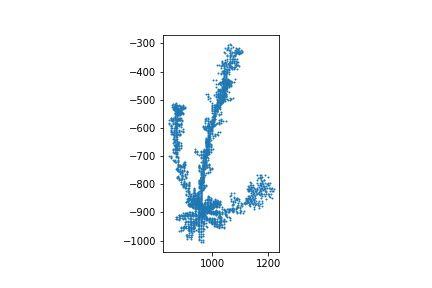

In [39]:
ind = torch_voxels[:,3]==1
test.local_proj(xy_coords, N_cam, ind)
with open('test_cloud/virtual_scan.gif','rb') as file:
    display(IPIMage(file.read()))
    

#### Ensure they correspond to the training images

In [14]:
#permute x and y coordinates
xy_coords[:, 2, :] = xy_coords[:,0,:]
xy_coords[:, 0, :] = xy_coords[:,1,:]
xy_coords[:, 1, :] = xy_coords[:,2,:]
s = 1.
maxi = torch.tensor([xinit, yinit])

ind = torch_voxels[:,3]==1
coords = xy_coords[:,:,ind].clone()

image = torch.zeros(int(maxi[0]), int(maxi[1]))

coords = coords.int()

images = []
for i in range(N_cam):
    image = torch.zeros(int(maxi[0]), int(maxi[1]))
    ind_i = coords[i][0,:]>0
    coords_i = coords[i][:, ind_i]
    ind_i = coords_i[1,:]>0
    coords_i = coords_i[:, ind_i]
    ind_i = coords_i[0,:] < int(maxi[0])
    coords_i = coords_i[:, ind_i]
    ind_i = coords_i[1,:] < int(maxi[1])
    coords_i = coords_i[:, ind_i]

    image[coords_i[0,:].long(), coords_i[1,:].long()] = 1

    images.append(image)

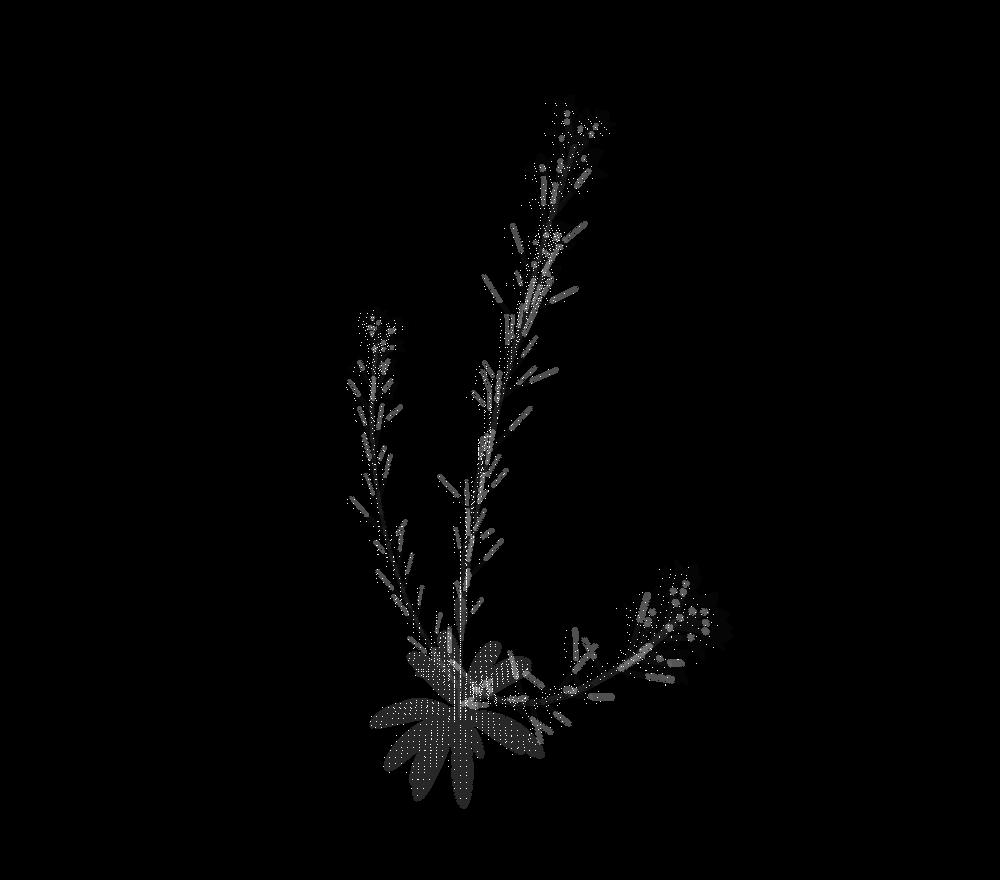

In [21]:
imbis = [u[200:1080, 500:1500] for u in images]

for i in range(N_cam):
    mask = imbis[i].numpy()
    im = np.array(Image.open('segmentation_arabidopsis/arabidopsis%03d/labels/arabidopsis%03d_image%03d.png'%(n, n, i)))
    im = im[200:1080, 500:1500]  * 5
    im[mask == 1] = 255
    imbis[i] = (im.astype(np.uint8))

imageio.mimsave('cloud_sample/virtual_scan_torch%d_ims.gif'%n, imbis)

with open('cloud_sample/virtual_scan_torch%d_ims.gif'%n,'rb') as file:
    display(IPIMage(file.read()))